### Analysing points of lucky escapes using FCD, OSM & Accident data For the city of Bremen

In [4]:
%load_ext autoreload
%autoreload 2
# load dependencies
import pandas as pd
import geopandas as gpd
import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
import folium 
import seaborn as sns
import osmnx as ox
import networkx as nx
import pyproj
import math 
import seaborn as sns
import scipy.stats as stats
from datetime import datetime
import pysal 
from pysal import esda
#import libpysal #added
pd.options.mode.chained_assignment = None 
#from pysal.explore import esda
from pyproj import CRS
from pyproj import Transformer
from envirocar import TrackAPI, DownloadClient, BboxSelector, ECConfig

# create an initial but optional config and an api client
config = ECConfig()
track_api = TrackAPI(api_client=DownloadClient(config=config))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
#Bremen Bounding box
bbox = BboxSelector([
    8.470458984375, # min_x
    52.884048623975254, # min_y
    9.16259765625, # max_x
    53.18464174858166  # max_y
])

#issue a query
track_df = track_api.get_tracks(bbox=bbox, num_results=150) # requesting 150 tracks inside the bbox
#display output
track_df

,id,time,geometry,GPS Altitude.value,GPS Altitude.unit,Calculated MAF.value,Calculated MAF.unit,GPS Bearing.value,GPS Bearing.unit,Rpm.value,...,O2 Lambda Current.value,O2 Lambda Current.unit,O2 Lambda Current ER.value,O2 Lambda Current ER.unit,track.appVersion,track.touVersion,Long-Term Fuel Trim 1.value,Long-Term Fuel Trim 1.unit,Short-Term Fuel Trim 1.value,Short-Term Fuel Trim 1.unit
0,5f09b07130d93d341d386142,2020-07-02T19:58:10,POINT (8.78770 53.07645),49.032059,m,21.812556,g/s,209.967426,deg,1895.495021,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5f09b07130d93d341d386144,2020-07-02T19:58:15,POINT (8.78748 53.07606),50.999999,m,10.921237,g/s,200.322314,deg,1911.216610,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5f09b07130d93d341d386145,2020-07-02T19:58:20,POINT (8.78709 53.07553),52.418932,m,16.105837,g/s,204.788521,deg,1678.418530,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5f09b07130d93d341d386146,2020-07-02T19:58:25,POINT (8.78669 53.07499),53.738049,m,7.144489,g/s,204.409566,deg,987.728977,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5f09b07130d93d341d386147,2020-07-02T19:58:30,POINT (8.78660 53.07483),51.999998,m,6.587976,g/s,134.734194,deg,818.510535,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
892,55241886e4b0bf5f3e43b7f1,2015-04-03T11:33:52,POINT (9.28851 53.19283),72.000000,m,4.707535,g/s,13.800000,deg,850.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,27.34375,%,3.12500,%
893,55241886e4b0bf5f3e43b7f3,2015-04-03T11:33:57,POINT (9.28860 53.19311),70.000000,m,4.503034,g/s,10.600000,deg,879.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,27.34375,%,0.00000,%
894,55241886e4b0bf5f3e43b7f5,2015-04-03T11:34:02,POINT (9.28877 53.19323),70.000000,m,4.582361,g/s,82.300003,deg,874.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,27.34375,%,3.12500,%
895,55241886e4b0bf5f3e43b7f7,2015-04-03T11:34:08,POINT (9.28877 53.19322),72.000000,m,4.058064,g/s,92.300003,deg,774.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,27.34375,%,0.00000,%


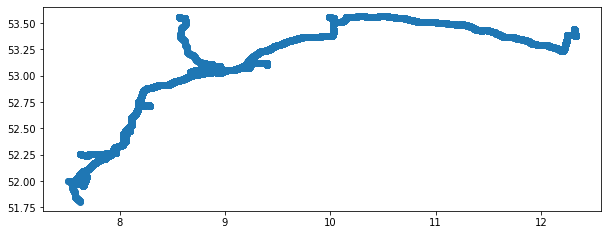

In [6]:
#Track plot
track_df.plot(figsize=(10, 12))

In [7]:
#dataframe details
track_df.describe()

,GPS Altitude.value,Calculated MAF.value,GPS Bearing.value,Rpm.value,GPS Speed.value,GPS VDOP.value,GPS PDOP.value,CO2.value,GPS HDOP.value,Speed.value,...,track.length,sensor.engineDisplacement,sensor.constructionYear,O2 Lambda Voltage.value,MAF.value,O2 Lambda Voltage ER.value,O2 Lambda Current.value,O2 Lambda Current ER.value,Long-Term Fuel Trim 1.value,Short-Term Fuel Trim 1.value
count,71428.000000,65640.000000,71362.000000,71252.000000,71428.000000,67860.000000,67860.000000,57474.000000,67860.000000,71254.000000,...,71428.000000,71428.000000,71428.00000,3454.000000,15739.000000,3454.000000,2156.000000,2156.000000,1963.000000,1963.000000
mean,64.457680,21.731062,141.923818,2249.296918,83.870535,1.008954,1.220067,17.065947,0.653266,83.419250,...,124.205915,1816.003066,2007.73789,1.706443,51.871846,0.835158,-8.783436,1.713384,5.838879,0.134122
std,28.822222,13.367233,104.223716,1043.097968,45.363483,6.368583,6.370805,11.224235,6.364243,44.914755,...,136.155545,84.622378,1.92269,1.088815,29.056085,0.754847,67.620657,0.264192,10.496774,2.342366
min,-14.130938,-3.318304,0.000000,-183.913050,0.000000,0.600000,0.800000,-2.563380,0.306535,0.000000,...,0.000000,1598.000000,2003.00000,0.000000,0.511236,0.059025,-127.999996,0.993906,-9.375000,-7.812500
25%,47.000000,9.517876,52.487549,1531.694138,49.503505,0.800000,0.830517,6.166467,0.400000,49.000001,...,39.249555,1798.000000,2007.00000,0.417364,31.361176,0.107224,-69.709780,1.503280,-4.687500,-0.781250
50%,55.000000,19.911554,118.000000,2140.000000,91.235071,0.800000,1.000000,14.923797,0.417600,91.000000,...,43.862994,1798.000000,2007.00000,2.363750,48.702719,0.333024,-9.959566,1.765377,10.156250,0.000000
75%,79.000000,31.944442,234.825885,3052.385820,123.449495,1.000000,1.200000,25.920365,0.600000,122.000004,...,169.372465,1798.000000,2007.00000,2.543202,67.440002,1.531418,47.939265,1.999969,14.062500,1.562500
max,200.299988,73.029040,359.899994,16256.000000,200.827389,500.000000,500.000000,63.421996,500.000000,373.333340,...,450.813642,1995.000000,2012.00000,3.216002,229.504289,1.999970,106.371704,1.999970,27.343750,19.531250


In [8]:
#sorting by the track id
track_df.groupby(track_df['track.id']).count()

,id,time,geometry,GPS Altitude.value,GPS Altitude.unit,Calculated MAF.value,Calculated MAF.unit,GPS Bearing.value,GPS Bearing.unit,Rpm.value,...,O2 Lambda Current.value,O2 Lambda Current.unit,O2 Lambda Current ER.value,O2 Lambda Current ER.unit,track.appVersion,track.touVersion,Long-Term Fuel Trim 1.value,Long-Term Fuel Trim 1.unit,Short-Term Fuel Trim 1.value,Short-Term Fuel Trim 1.unit
track.id,,,,,,,,,,,,,,,,,,,,,
55241883e4b0bf5f3e43a5e5,897,897,897,897,897,896,896,886,886,896,...,0,0,0,0,0,0,896,896,896,896
552418ace4b0bf5f3e43d3ad,1105,1105,1105,1105,1105,1067,1067,1050,1050,1067,...,0,0,0,0,0,0,1067,1067,1067,1067
558ebac4e4b07207d892393f,2722,2722,2722,2722,2722,2722,2722,2722,2722,2722,...,0,0,0,0,0,0,0,0,0,0
558ebb18e4b07207d89263ca,2722,2722,2722,2722,2722,2722,2722,2722,2722,2722,...,0,0,0,0,2722,2722,0,0,0,0
558ebb7ae4b07207d8928e55,2722,2722,2722,2722,2722,2722,2722,2722,2722,2722,...,0,0,0,0,2722,2722,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5f09b06c30d93d341d384e67,382,382,382,382,382,381,381,382,382,381,...,0,0,0,0,0,0,0,0,0,0
5f09b06c30d93d341d384fe8,429,429,429,429,429,428,428,429,429,428,...,0,0,0,0,0,0,0,0,0,0
5f09b06e30d93d341d3857f0,394,394,394,394,394,393,393,394,394,393,...,0,0,0,0,0,0,0,0,0,0


,id,track.id,time,lat,lng,speed,year,month,spddiff
0,5f09b07130d93d341d386142,5f09b07130d93d341d386140,2020-07-02T19:58:10,53.076447,8.787704,24.144460,2020,7,0.000000
1,5f09b07130d93d341d386144,5f09b07130d93d341d386140,2020-07-02T19:58:15,53.076061,8.787480,36.833922,2020,7,12.689462
2,5f09b07130d93d341d386145,5f09b07130d93d341d386140,2020-07-02T19:58:20,53.075527,8.787092,48.887996,2020,7,12.054074
3,5f09b07130d93d341d386146,5f09b07130d93d341d386140,2020-07-02T19:58:25,53.074988,8.786691,29.536781,2020,7,-19.351215
4,5f09b07130d93d341d386147,5f09b07130d93d341d386140,2020-07-02T19:58:30,53.074832,8.786597,0.227482,2020,7,-29.309299


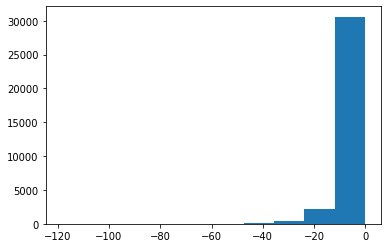

In [13]:
#Calculating the speed difference at points
track_df['lat'] = track_df['geometry'].apply(lambda coord: coord.y)
track_df['lng'] = track_df['geometry'].apply(lambda coord: coord.x)
track_df['speed'] = track_df['GPS Speed.value']
track_df['time_year'] = pd.to_datetime(track_df['time'], format = "%Y-%m")
track_df['year'] = track_df['time_year'].dt.year
track_df['month'] = track_df['time_year'].dt.month

#Creating a new subset of the data
data_df = track_df[['id','track.id','time','lat','lng','speed','year','month']]
speed = data_df['speed']

#Calculating speed different between points
spd_list = []
index = 0
for cal in speed:
    currspd = cal
    if index > 0:
        diff = currspd - prvspd
        spd_list.append(diff)
    else:
        spd_list.append(0)
    prvspd = currspd
    index += 1


data_df['spddiff']= spd_list
neg_speed = data_df[data_df['spddiff']<0]  #de-accelaration points

#plot data
plt.hist(neg_speed['spddiff'])

#displaying output
data_df.head()

In [14]:
#mean reduction on speed on track
np.mean(neg_speed['spddiff'])

-3.951018395295412

In [16]:
#making a function to color based on speed difference
def colors(array):
    col = []
    for value in array:
        if value < 0 and value > -5:
            col.append('yellow')
        elif value < -5 and value > -20:
            col.append('green')
        else:
            col.append('red')
    return col

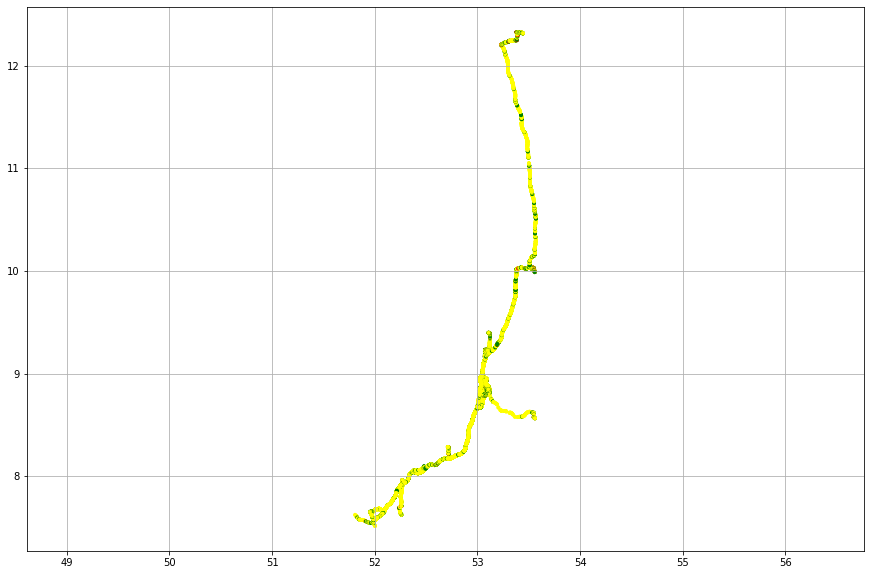

In [17]:
#plotting the tracks based on the reduction in speed
cols = colors(neg_speed['spddiff'])
f,axxarr = plt.subplots(1, figsize = (15,10))   
axxarr.scatter(neg_speed['lat'], neg_speed['lng'], c=cols, cmap='Accent', s=15, lw=0)

plt.axis('equal')
axxarr.grid(True)
plt.show()

In [20]:
#making a subset of the data with negative data only
neg_data = data_df[data_df['spddiff'] < 0]
neg_data

,id,track.id,time,lat,lng,speed,year,month,spddiff
3,5f09b07130d93d341d386146,5f09b07130d93d341d386140,2020-07-02T19:58:25,53.074988,8.786691,29.536781,2020,7,-19.351215
4,5f09b07130d93d341d386147,5f09b07130d93d341d386140,2020-07-02T19:58:30,53.074832,8.786597,0.227482,2020,7,-29.309299
5,5f09b07130d93d341d386148,5f09b07130d93d341d386140,2020-07-02T19:58:35,53.074835,8.786597,0.000000,2020,7,-0.227482
24,5f09b07130d93d341d38615b,5f09b07130d93d341d386140,2020-07-02T20:00:11,53.068838,8.779811,75.218375,2020,7,-0.710389
25,5f09b07130d93d341d38615c,5f09b07130d93d341d386140,2020-07-02T20:00:16,53.068025,8.779053,71.490484,2020,7,-3.727891
...,...,...,...,...,...,...,...,...,...
879,55241886e4b0bf5f3e43b7d7,55241883e4b0bf5f3e43a5e5,2015-04-03T11:32:39,53.192609,9.286335,0.000000,2015,4,-14.076000
892,55241886e4b0bf5f3e43b7f1,55241883e4b0bf5f3e43a5e5,2015-04-03T11:33:52,53.192830,9.288514,19.769539,2015,4,-16.518533
893,55241886e4b0bf5f3e43b7f3,55241883e4b0bf5f3e43a5e5,2015-04-03T11:33:57,53.193108,9.288600,18.648138,2015,4,-1.121400
894,55241886e4b0bf5f3e43b7f5,55241883e4b0bf5f3e43a5e5,2015-04-03T11:34:02,53.193227,9.288771,12.139688,2015,4,-6.508450


In [21]:
#identify first record in each track and adding a default value of 0
tracks_id = (neg_data['id'].groupby(neg_data['track.id']).nth(0)).tolist()
neg_data['spddiff'][neg_data['id'].isin(tracks_id)] = 0

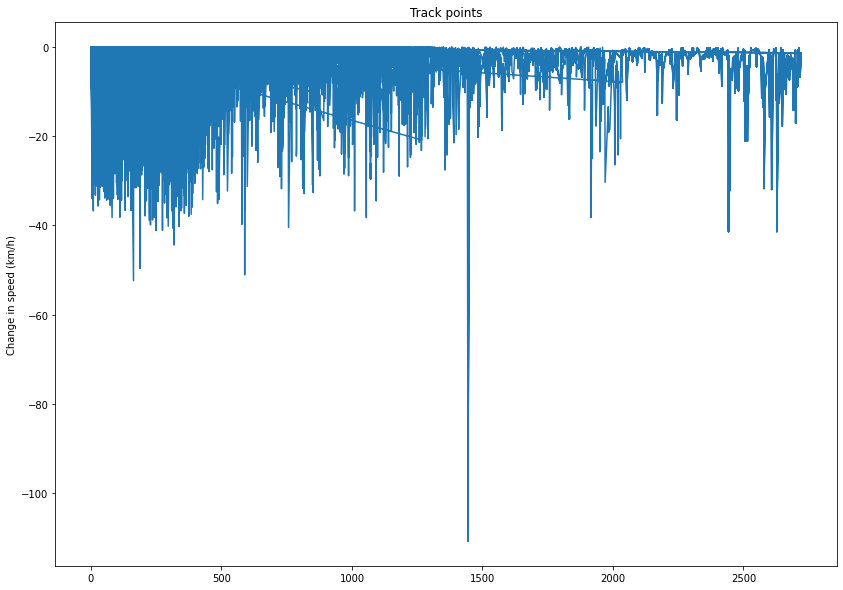

In [22]:
#plotting the change in speed
ax = neg_data['spddiff'].plot(figsize= (14, 10))
ax.set_title("Track points")
ax.set_ylabel("Change in speed (km/h)")
ax        

In [24]:
#adding colors to the points based on speed reduction using the colors function above
cols_some = colors(neg_data['spddiff'])
print(len(cols_some))
cols_some.pop()
len(cols_some)

33312


33311

### Mapping Points of Speed Reduction

In [25]:
#plotting points on a map using folium
lats = list(neg_data['lat'])
lngs = list(neg_data['lng'])
speed = list(neg_data['spddiff']) 
speedactual = list(neg_data['speed'])
avg_lat = sum(lats) / len(lats)
avg_lngs = sum(lngs) / len(lngs)
def popfn(popa, popb):
    return('Speed Difference is: '+ str(round(popa, 2))+ 'Km/h'+'\n Actual speed is:' + str(round(popb, 2))+'Km/h')

m = folium.Map(location=[avg_lat, avg_lngs], tiles = 'cartodbpositron', zoom_start=8)
for lat, lng , col, pop,pop1 in zip(lats,lngs, cols_some, speed, speedactual ):
    folium.CircleMarker([lat, lng], color= col , radius=2.0, popup = popfn(pop, pop1)).add_to(m)
m.save('DecelarationPointsBremen.html')

## Downloading OSM Data for Bremen

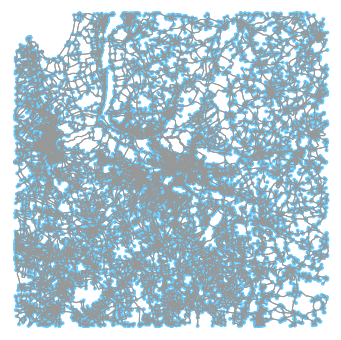

(<Figure size 721.736x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a3ea6ded0>)

In [30]:
#downloading road netwrok from osmnx
G = ox.graph_from_point((53.07, 8.80), dist=50000, network_type='drive')
ox.plot_graph(G)

In [31]:
#exploring the data frame
edges = ox.graph_to_gdfs(G, nodes=False, edges=True)
edges.columns

Index(['u', 'v', 'key', 'osmid', 'lanes', 'name', 'highway', 'maxspeed',
       'oneway', 'length', 'geometry', 'ref', 'bridge', 'access', 'width',
       'tunnel', 'junction', 'area', 'est_width', 'service'],
      dtype='object')

In [32]:
#checking the speed limits on osm data
print(edges['maxspeed'].value_counts())

30                   49535
50                   29382
100                   4028
70                    3625
[100, 70]              837
                     ...  
[signals, none]          1
[40, 80]                 1
[none, 40]               1
[signals, 60, 80]        1
[70, DE:rural]           1
Name: maxspeed, Length: 111, dtype: int64


In [33]:
#exploring the edges in osm network
edges.head()

,u,v,key,osmid,lanes,name,highway,maxspeed,oneway,length,geometry,ref,bridge,access,width,tunnel,junction,area,est_width,service
0,5520752640,31119067,0,575304707,2,Heinz-Lemmermann-Weg,residential,50,False,231.220,"LINESTRING (8.94994 53.16049, 8.94962 53.16054...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,83623940,83623949,0,24586723,2,NaN,motorway_link,NaN,False,93.728,"LINESTRING (8.23092 53.06157, 8.23063 53.06133...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,83623940,267281976,0,25671346,NaN,Streeker Trift,unclassified,70,False,1316.621,"LINESTRING (8.23092 53.06157, 8.23173 53.06225...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,83623940,85675471,0,171077758,NaN,Bümmersteder Straße,tertiary,70,False,437.113,"LINESTRING (8.23092 53.06157, 8.23052 53.06175...",K 346,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83623940,330342598,0,"[182897080, 24586707, 171077758]",NaN,Bümmersteder Straße,tertiary,70,False,230.007,"LINESTRING (8.23092 53.06157, 8.23216 53.06102...",K 346,yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
#reprojecting the OSM data to projected crs and applying a buffer
prjedge = edges.to_crs('EPSG:25832')
prjedge['geometry'] = prjedge.geometry.buffer(5)
prjedge.head()

,u,v,key,osmid,lanes,name,highway,maxspeed,oneway,length,geometry,ref,bridge,access,width,tunnel,junction,area,est_width,service
0,5520752640,31119067,0,575304707,2,Heinz-Lemmermann-Weg,residential,50,False,231.220,"POLYGON ((496630.287 5890125.667, 496629.794 5...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,83623940,83623949,0,24586723,2,NaN,motorway_link,NaN,False,93.728,"POLYGON ((448444.987 5879366.516, 448436.645 5...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,83623940,267281976,0,25671346,NaN,Streeker Trift,unclassified,70,False,1316.621,"POLYGON ((448511.503 5879473.478, 448551.172 5...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,83623940,85675471,0,171077758,NaN,Bümmersteder Straße,tertiary,70,False,437.113,"POLYGON ((448431.018 5879412.165, 448430.945 5...",K 346,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83623940,330342598,0,"[182897080, 24586707, 171077758]",NaN,Bümmersteder Straße,tertiary,70,False,230.007,"POLYGON ((448545.869 5879337.775, 448546.185 5...",K 346,yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [35]:
#Converting the deceleration data to a dataframe and reprojecting to a projected CRS
neg_gdf = gpd.GeoDataFrame(
    neg_data, geometry=gpd.points_from_xy(neg_data.lng, neg_data.lat),crs="EPSG:4326")
neg_gdf = neg_gdf.to_crs('EPSG:25832')
neg_gdf.head()

,id,track.id,time,lat,lng,speed,year,month,spddiff,geometry
3,5f09b07130d93d341d386146,5f09b07130d93d341d386140,2020-07-02T19:58:25,53.074988,8.786691,29.536781,2020,7,0.000000,POINT (485709.602 5880633.633)
4,5f09b07130d93d341d386147,5f09b07130d93d341d386140,2020-07-02T19:58:30,53.074832,8.786597,0.227482,2020,7,-29.309299,POINT (485703.257 5880616.334)
5,5f09b07130d93d341d386148,5f09b07130d93d341d386140,2020-07-02T19:58:35,53.074835,8.786597,0.000000,2020,7,-0.227482,POINT (485703.210 5880616.632)
24,5f09b07130d93d341d38615b,5f09b07130d93d341d386140,2020-07-02T20:00:11,53.068838,8.779811,75.218375,2020,7,-0.710389,POINT (485246.570 5879950.899)
25,5f09b07130d93d341d38615c,5f09b07130d93d341d386140,2020-07-02T20:00:16,53.068025,8.779053,71.490484,2020,7,-3.727891,POINT (485195.472 5879860.644)


In [36]:
#Joinig the buffered OSM data with deceleration data
neg_gdf_join_osmedge = gpd.sjoin(neg_gdf, prjedge, op='intersects')
len(neg_gdf_join_osmedge)

26854

In [37]:
#Sorting to get the minimum speed limit on roads with more than one speed limit 
def getMin(inp):
    min = 10000  #defining a high value 
    for i in inp:
        if i < min:
            min = i
    return min
        

In [38]:
#Sorting the speed limits
#in case there is more than one speed limit in an edge and also places with no speed limit
#no speed limit will be substituted with 130 km/h based on literature
#for edges with 2 or more speed limits the lower value is considered
speed_lst = []
for m in neg_gdf_join_osmedge['maxspeed']:
    if (type(m) ==str and len(m) <= 3):
        speed_lst.append(int(m))
    elif type(m) == list:
        conv = []
        for n in m:
            try:
                conv.append(int(n))
            except ValueError:
                conv.append(130)
        speed_lst.append(getMin(conv))        
        
    else:
        speed_lst.append(130)
            
print(speed_lst)   

[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 50, 50, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70,

In [39]:
#Removing columns that are not needed
neg_gdf_join_osmedge['spdlimit'] = speed_lst
neg_gdf_join_osmedge_new = neg_gdf_join_osmedge[['track.id', 'lat', 'lng', 'speed', 'spddiff', 'geometry', 'spdlimit','year', 'month']]
neg_gdf_join_osmedge_new

,track.id,lat,lng,speed,spddiff,geometry,spdlimit,year,month
3,5f09b07130d93d341d386140,53.074988,8.786691,29.536781,0.000000,POINT (485709.602 5880633.633),50,2020,7
4,5f09b07130d93d341d386140,53.074832,8.786597,0.227482,-29.309299,POINT (485703.257 5880616.334),50,2020,7
5,5f09b07130d93d341d386140,53.074835,8.786597,0.000000,-0.227482,POINT (485703.210 5880616.632),50,2020,7
56,5eec7ab5d6e3cf256ba40e8d,53.075198,8.786861,32.098646,-7.796406,POINT (485721.065 5880656.993),50,2020,6
57,5eec7ab5d6e3cf256ba40e8d,53.074921,8.786679,11.528623,-20.570024,POINT (485708.769 5880626.156),50,2020,6
...,...,...,...,...,...,...,...,...,...
877,55241883e4b0bf5f3e43a5e5,53.192665,9.285736,32.585092,-28.914423,POINT (519090.329 5893741.367),100,2015,4
878,55241883e4b0bf5f3e43a5e5,53.192627,9.286253,14.076000,-18.509092,POINT (519124.914 5893737.251),100,2015,4
878,55241883e4b0bf5f3e43a5e5,53.192627,9.286253,14.076000,-18.509092,POINT (519124.914 5893737.251),100,2015,4
879,55241883e4b0bf5f3e43a5e5,53.192609,9.286335,0.000000,-14.076000,POINT (519130.380 5893735.334),100,2015,4


In [40]:
#Getting the speed above the limit by atleast 5km/h 
neg_gdf_join_osmedge_new['ovrspd'] = neg_gdf_join_osmedge_new['speed']-neg_gdf_join_osmedge_new['spdlimit']
neg_gdf_join_osmedge_new[neg_gdf_join_osmedge_new['ovrspd'] > 5]

,track.id,lat,lng,speed,spddiff,geometry,spdlimit,year,month,ovrspd
24,5f09b07130d93d341d386140,53.068838,8.779811,75.218375,-0.710389,POINT (485246.570 5879950.899),60,2020,7,15.218375
25,5f09b07130d93d341d386140,53.068025,8.779053,71.490484,-3.727891,POINT (485195.472 5879860.644),60,2020,7,11.490484
26,5f09b07130d93d341d386140,53.067252,8.778383,68.586714,-2.903770,POINT (485150.346 5879774.710),60,2020,7,8.586714
67,5eec7ab5d6e3cf256ba40e8d,53.070435,8.781658,69.799840,-1.461526,POINT (485370.827 5880128.131),60,2020,6,9.799840
70,5eec7ab5d6e3cf256ba40e8d,53.068209,8.779239,66.619274,-5.195072,POINT (485207.989 5879881.028),60,2020,6,6.619274
...,...,...,...,...,...,...,...,...,...,...
930,558ebb18e4b07207d89263ca,53.023261,8.802925,120.471295,-2.476978,POINT (486781.345 5874876.249),70,2015,6,50.471295
930,558ebb7ae4b07207d8928e55,53.023261,8.802925,120.471295,-2.476978,POINT (486781.345 5874876.249),70,2015,6,50.471295
406,55241883e4b0bf5f3e43a5e5,52.796781,8.205349,136.154979,-1.977690,POINT (446421.047 5849960.434),130,2015,4,6.154979
406,55241883e4b0bf5f3e43a5e5,52.796781,8.205349,136.154979,-1.977690,POINT (446421.047 5849960.434),130,2015,4,6.154979


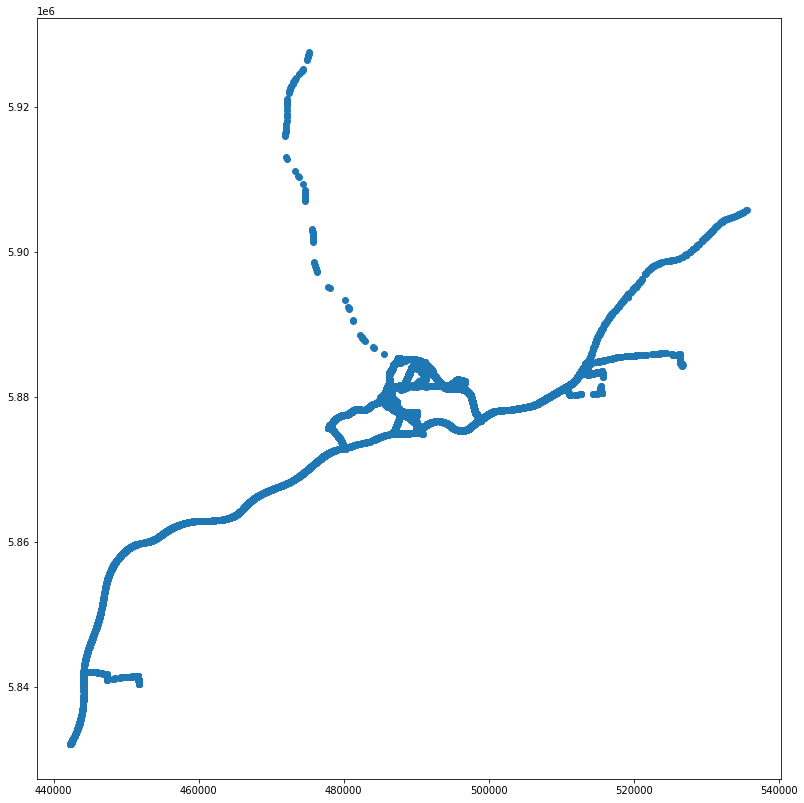

In [41]:
#converting the data frame to goegraphic coordinates and plotting 
neg_gdf_join_osmedge_new.to_crs('EPSG:4326')
neg_gdf_join_osmedge_new.plot(figsize = (14,14))

## Analysing accident data

In [42]:
#reading the accident data from CSV
accident = pd.read_csv('Bremen_acc_modified.csv', usecols=['year','month','hour', 'day_of_week', 'accident_category','longitude', 'latitude'])
accident

,month,year,hour,accident_category,longitude,latitude,day_of_week
0,8,15,18,5.0,8.737263,53.143835,5
1,9,15,14,3.0,8.914209,53.038981,3
2,8,15,14,5.0,8.780575,53.068084,7
3,8,15,9,3.0,8.778113,53.064216,5
4,8,15,13,3.0,8.783901,53.065758,5
...,...,...,...,...,...,...,...
34770,6,18,17,5.0,8.749113,53.160368,5
34771,9,18,13,5.0,8.894172,53.059490,2
34772,8,17,9,3.0,8.891053,53.071478,3
34773,12,16,9,3.0,8.818448,53.077264,2


In [43]:
#Making a geodataframe of the acident data 
accident_gdf = gpd.GeoDataFrame(
    accident, geometry=gpd.points_from_xy(accident.longitude, accident.latitude),crs="EPSG:4326")

### Hotspot analysis of accidents 

In [44]:
#Grouping accidents by position & category
accident_gdf_category = accident_gdf.groupby(['longitude','latitude'])[['accident_category']].mean().reset_index()
accident_gdf_category.head()

,longitude,latitude,accident_category
0,8.508739,53.221201,3.0
1,8.508849,53.220920,5.0
2,8.508863,53.220912,5.0
3,8.509131,53.220115,5.0
4,8.509141,53.220104,5.0


In [52]:
#imoporting the getisOrd function
import getis 

In [46]:
#function to define the color bands
def clr(array):
    col = []
    for value in array:
        if value > 0: 
            col.append('red')
        else:
            col.append('#C2FF00')
    return col

### Mapping Hot & Cold Spots and Overspeeding Points

In [53]:
#plotting the points of overspeeding and hot spots of accident
lats = list(neg_gdf_join_osmedge_new['lat'])
lngs = list(neg_gdf_join_osmedge_new['lng'])
speed = list(neg_gdf_join_osmedge_new['ovrspd']) 
spdlmt = list(neg_gdf_join_osmedge_new['spdlimit'])
def poplt(a,b):
    return('Speed limit is: '+ str(a) +'Km/h' +'\n above limit by:' + str(round(b, 2))+ 'Km/h')

avg_lat = sum(lats) / len(lats)
avg_lngs = sum(lngs) / len(lngs)
ovrspdclr = clr(neg_gdf_join_osmedge_new['ovrspd'])
m = folium.Map(location=[avg_lat, avg_lngs], tiles = 'cartodbpositron', zoom_start=12)
for lat, lng , col, pop, pop1 in zip(lats,lngs, ovrspdclr, spdlmt, speed):
    folium.CircleMarker([lat, lng], color= col , radius=2.0, popup = poplt(pop, pop1)).add_to(m)
getisacc = getis.getisOrd(accident_gdf_category, value='accident_category', threshold=150, lat='latitude', lng= 'longitude')
getis.map(m, getisacc, value = 'accident_category', style ='hotspots', lat='latitude', lng= 'longitude')
m.save('OverspeedHotColdSpotBremen.html')

/opt/anaconda3/lib/python3.7/site-packages/pysal/weights/weights.py:189: UserWarning: There are 48 disconnected observations
  warnings.warn("There are %d disconnected observations" % ni)
/opt/anaconda3/lib/python3.7/site-packages/pysal/weights/weights.py:190: UserWarning: Island ids: 21, 23, 740, 1086, 1171, 1190, 1222, 2505, 2579, 2614, 2654, 2762, 3820, 4419, 4461, 4485, 4493, 4763, 4794, 4838, 4857, 4865, 5392, 5570, 5815, 5979, 6071, 6078, 6108, 6272, 6405, 6546, 7158, 14005, 15735, 19359, 22475, 23515, 26602, 28787, 29047, 29365, 31841, 32246, 33176, 33242, 34219, 34223
  warnings.warn("Island ids: %s" % ', '.join(str(island) for island in self.islands))
/opt/anaconda3/lib/python3.7/site-packages/pysal/esda/getisord.py:434: RuntimeWarning: invalid value encountered in true_divide
  self.Zs = (self.Gs - self.EGs) / np.sqrt(self.VGs)


In [58]:
#reprojecting CRS of accident data to projected and buffering by 100m
accident_gdf_proj = accident_gdf.to_crs('EPSG:25832')
accident_gdf_proj['geometry'] = accident_gdf_proj.geometry.buffer(100)
accident_gdf_proj.head()   #output

,month,year,hour,accident_category,longitude,latitude,day_of_week,geometry
0,8,15,18,5.0,8.737263,53.143835,5,"POLYGON ((482526.293 5888303.420, 482525.812 5..."
1,9,15,14,3.0,8.914209,53.038981,3,"POLYGON ((494347.722 5876610.298, 494347.240 5..."
2,8,15,14,5.0,8.780575,53.068084,7,"POLYGON ((485397.492 5879866.859, 485397.010 5..."
3,8,15,9,3.0,8.778113,53.064216,5,"POLYGON ((485231.194 5879437.080, 485230.713 5..."
4,8,15,13,3.0,8.783901,53.065758,5,"POLYGON ((485619.569 5879607.398, 485619.087 5..."


In [68]:
#Joining FCD with Accident data based on where points intersect in 100m radius
fcd_osm_acc_join = gpd.sjoin(neg_gdf_join_osmedge_new, accident_gdf_proj,how= 'inner', op='intersects')

In [69]:
#exploring the tracks after the join
fcd_osm_acc_join.groupby(fcd_osm_acc_join['track.id']).count()

,lat,lng,speed,spddiff,geometry,spdlimit,year_left,month_left,ovrspd,index_right,month_right,year_right,hour,accident_category,longitude,latitude,day_of_week
track.id,,,,,,,,,,,,,,,,,
55241883e4b0bf5f3e43a5e5,1167,1167,1167,1167,1167,1167,1167,1167,1167,1167,1167,1167,1167,1167,1167,1167,1167
552418ace4b0bf5f3e43d3ad,911,911,911,911,911,911,911,911,911,911,911,911,911,911,911,911,911
558ebac4e4b07207d892393f,966,966,966,966,966,966,966,966,966,966,966,966,966,966,966,966,966
558ebb18e4b07207d89263ca,966,966,966,966,966,966,966,966,966,966,966,966,966,966,966,966,966
558ebb7ae4b07207d8928e55,966,966,966,966,966,966,966,966,966,966,966,966,966,966,966,966,966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5f09b06c30d93d341d384e67,3517,3517,3517,3517,3517,3517,3517,3517,3517,3517,3517,3517,3517,3517,3517,3517,3517
5f09b06c30d93d341d384fe8,4326,4326,4326,4326,4326,4326,4326,4326,4326,4326,4326,4326,4326,4326,4326,4326,4326
5f09b06e30d93d341d3857f0,2763,2763,2763,2763,2763,2763,2763,2763,2763,2763,2763,2763,2763,2763,2763,2763,2763


In [70]:
#points which FCD track is above speed limit by more than 10Km/h and within 100m to an accident point
#please not the temporal frame might not be exact.
fcd_osm_acc_join = fcd_osm_acc_join[fcd_osm_acc_join['ovrspd']>10]
fcd_osm_acc_join

,track.id,lat,lng,speed,spddiff,geometry,spdlimit,year_left,month_left,ovrspd,index_right,month_right,year_right,hour,accident_category,longitude,latitude,day_of_week
1089,5e08bc7f5bc8db42896412c5,53.074186,8.786563,62.177574,-2.553435,POINT (485700.761 5880544.425),50,2019,12,12.177574,32751,9,16,18,5.0,8.786927,53.074994,6
1089,5e08bc7f5bc8db42896412c5,53.074186,8.786563,62.177574,-2.553435,POINT (485700.761 5880544.425),50,2019,12,12.177574,21287,6,18,10,5.0,8.786711,53.075035,2
1089,5e08bc7f5bc8db42896412c5,53.074186,8.786563,62.177574,-2.553435,POINT (485700.761 5880544.425),50,2019,12,12.177574,34287,11,17,17,3.0,8.786852,53.075052,4
1089,5e08bc7f5bc8db42896412c5,53.074186,8.786563,62.177574,-2.553435,POINT (485700.761 5880544.425),50,2019,12,12.177574,29580,6,16,10,5.0,8.786766,53.074530,2
1089,5e08bc7f5bc8db42896412c5,53.074186,8.786563,62.177574,-2.553435,POINT (485700.761 5880544.425),50,2019,12,12.177574,15549,12,18,15,5.0,8.786327,53.074531,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938,558ebb18e4b07207d89263ca,53.023697,8.825204,126.776349,-2.476964,POINT (488275.794 5874920.912),80,2015,6,46.776349,20287,7,16,23,5.0,8.823995,53.023844,2
938,558ebb7ae4b07207d8928e55,53.023697,8.825204,126.776349,-2.476964,POINT (488275.794 5874920.912),80,2015,6,46.776349,20287,7,16,23,5.0,8.823995,53.023844,2
938,558ebac4e4b07207d892393f,53.023697,8.825204,126.776349,-2.476964,POINT (488275.794 5874920.912),80,2015,6,46.776349,1624,6,15,19,5.0,8.825283,53.023870,2
938,558ebb18e4b07207d89263ca,53.023697,8.825204,126.776349,-2.476964,POINT (488275.794 5874920.912),80,2015,6,46.776349,1624,6,15,19,5.0,8.825283,53.023870,2


In [71]:
#renaming join column
fcd_osm_acc_join.rename(
    columns={
        "index_right": "right_index"
    },
    inplace=True
)

### Analysing data for Bars/pubs near accident spots

In [73]:
#reading data of location of pubs and dropping, renaming column not needed
pubs = pd.read_csv('pubsbremen.csv', usecols=['venue.name','venue.location.address','venue.location.lat', 'venue.location.lng'])
pubs['lat'] = pubs['venue.location.lat']
pubs['lng'] = pubs['venue.location.lng']
pubs['name'] = pubs['venue.name']
pubs['address'] = pubs['venue.location.address']
pubs= pubs.drop(columns=['venue.location.lat','venue.location.address','venue.location.lng','venue.name'])
pubs

,lat,lng,name,address
0,53.072943,8.822785,Heldenbar,Ostertorsteinweg 105
1,53.073407,8.824390,Fehrfeld,Fehrfeld 58
2,53.072847,8.822155,Wohnzimmer,Ostertorsteinweg 99
3,53.069684,8.787122,Mono,Langemarckstraße 207
4,53.072778,8.820219,Litfass,Ostertorsteinweg 22
...,...,...,...,...
61,53.069980,8.837551,Hopfen & Schmalz,Hamburger Straße
62,53.076447,8.812085,Craft Bier Bar,Am Wall 175
63,53.071071,8.801042,Efendy Shisha Lounge,NaN
64,53.075926,8.807232,John Benton,Am Markt 1


In [77]:
#making a dataframe of pubs csv and projecting to projected CRS & buffer by 500m
pubs_df = gpd.GeoDataFrame(
    pubs, geometry=gpd.points_from_xy(pubs.lng, pubs.lat),crs="EPSG:4326")
pubs_df_proj = pubs_df.to_crs('EPSG:25832')
pubs_df_proj['geometry'] = pubs_df_proj.geometry.buffer(500)

#display output
pubs_df_proj.head()

,lat,lng,name,address,geometry
0,53.072943,8.822785,Heldenbar,Ostertorsteinweg 105,"POLYGON ((488627.062 5880399.617, 488624.654 5..."
1,53.073407,8.824390,Fehrfeld,Fehrfeld 58,"POLYGON ((488734.741 5880450.886, 488732.333 5..."
2,53.072847,8.822155,Wohnzimmer,Ostertorsteinweg 99,"POLYGON ((488584.844 5880389.011, 488582.436 5..."
3,53.069684,8.787122,Mono,Langemarckstraße 207,"POLYGON ((486236.697 5880043.488, 486234.289 5..."
4,53.072778,8.820219,Litfass,Ostertorsteinweg 22,"POLYGON ((488455.161 5880381.664, 488452.753 5..."


In [81]:
#joining the FCD, ACC & Pubs data based on points they intersect 
fcd_osm_acc_pubs_join = gpd.sjoin(fcd_osm_acc_join,pubs_df_proj,how='inner', op='intersects')
fcd_osm_acc_pubs_join.head()

,track.id,lat_left,lng_left,speed,spddiff,geometry,spdlimit,year_left,month_left,ovrspd,...,hour,accident_category,longitude,latitude,day_of_week,index_right,lat_right,lng_right,name,address
165,5eabd64065b80c5d6bd9f6b5,53.076593,8.788087,71.466955,-0.532502,POINT (485803.611 5880811.906),60,2020,4,11.466955,...,23,5.0,8.787682,53.075755,2,40,53.07842,8.790832,Beck's Brauerei,Am Deich 18
165,5eabd64065b80c5d6bd9f6b5,53.076593,8.788087,71.466955,-0.532502,POINT (485803.611 5880811.906),60,2020,4,11.466955,...,6,5.0,8.787635,53.075787,2,40,53.07842,8.790832,Beck's Brauerei,Am Deich 18
165,5eabd64065b80c5d6bd9f6b5,53.076593,8.788087,71.466955,-0.532502,POINT (485803.611 5880811.906),60,2020,4,11.466955,...,16,5.0,8.787737,53.075838,7,40,53.07842,8.790832,Beck's Brauerei,Am Deich 18
165,5eabd64065b80c5d6bd9f6b5,53.076593,8.788087,71.466955,-0.532502,POINT (485803.611 5880811.906),60,2020,4,11.466955,...,14,5.0,8.787297,53.075872,3,40,53.07842,8.790832,Beck's Brauerei,Am Deich 18
165,5eabd64065b80c5d6bd9f6b5,53.076593,8.788087,71.466955,-0.532502,POINT (485803.611 5880811.906),60,2020,4,11.466955,...,9,5.0,8.787742,53.075896,5,40,53.07842,8.790832,Beck's Brauerei,Am Deich 18


### Mapping Accidents & Overspeeding points within 1km of a Bar

In [88]:
#displaying output on Map
#Overspeeding points with 500m to a bar/pub:
lats1 = list(fcd_osm_acc_pubs_join['lat_left'])
lngs1 = list(fcd_osm_acc_pubs_join['lng_left'])
overspeed = fcd_osm_acc_pubs_join['ovrspd']
speedlimit = fcd_osm_acc_pubs_join['spdlimit']

#Bars 500m to an accident
lat_pub = list(pubs_df['lat'])
lng_pub = list(pubs_df['lng'])
name = pubs_df['name']
address = pubs_df['address']
avg_lat = sum(lats1) / len(lats1)
avg_lngs = sum(lngs1) / len(lngs1)

#Popup funtion
def popup_acc_func(popa, popb):
    return('Over the limit by: '+ str(round(popa, 2))+ 'Km/h'+'\n The speed limit is:' + str(round(popb, 2))+'Km/h')
def popup_pub_func(popa, popb):
    return('Name: '+ str(popa)+'\n Address:' + str(popb))

m = folium.Map(location=[avg_lat, avg_lngs], tiles = 'cartodbpositron', zoom_start=12)
for lat, lng , pop,pop1 in zip(lats1, lngs1, overspeed, speedlimit):
    folium.CircleMarker([lat, lng], color= 'red' , radius=2.0, popup = popup_acc_func(pop, pop1)).add_to(m)
for lat, lng , pop,pop1 in zip(lat_pub, lng_pub, name, address):
    folium.CircleMarker([lat, lng], color= 'orange' , radius=4.0, popup = popup_pub_func(pop, pop1)).add_to(m)
m.save('OverspedAccidentCloseToPubsBremen.html')